In [ ]:
# %matplotlib ipympl

# this is not working rn come back to it later

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# from mpl_toolkits.mplot3d import Axes3D
from scipy import stats
from itertools import combinations


STRATEGIES = [
    "allgather_A_col",
    "allgather_A_col_no_compute",
    "allgather_A_row",
    "allgather_A_row_no_compute",
    "allgather_B_col",
    "allgather_B_col_no_compute",
    "allgather_B_row",
    "allgather_B_row_no_compute",
    "reducescatter_C_col",
    "reducescatter_C_col_no_compute",
    "reducescatter_C_row",
    "reducescatter_C_row_no_compute",
    "broadcast_based",
    "broadcast_based_no_compute",
    "broadcast_based_with_overlap",
    "broadcast_based_with_overlap_no_compute",
]  # removed throughput_test for now

COLUMN_NAMES = ["strategy", "size", "m", "n", "k", "throughput", "time", "memory"]
BENCHMARK_DIRECTORY = "../../../SuperComputerData/CondensedBenchmarks"
# 2-6 is messed up for now
PROCESSOR_VALUES = [8, 10, 12, 16, 24, 36, 48, 60, 72, 96, 120]

In [3]:
throughput = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n1-benchmark.csv", names=COLUMN_NAMES)

n8 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n8-benchmark.csv", names=COLUMN_NAMES)

n10 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n10-benchmark.csv", names=COLUMN_NAMES)

n12 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n12-benchmark.csv", names=COLUMN_NAMES)

n16 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n16-benchmark.csv", names=COLUMN_NAMES)

n24 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n24-benchmark.csv", names=COLUMN_NAMES)

n36 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n36-benchmark.csv", names=COLUMN_NAMES)

n48 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n48-benchmark.csv", names=COLUMN_NAMES)

n60 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n60-benchmark.csv", names=COLUMN_NAMES)

n72 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n72-benchmark.csv", names=COLUMN_NAMES)

n96 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n96-benchmark.csv", names=COLUMN_NAMES)

n120 = pd.read_csv(f"{BENCHMARK_DIRECTORY}/n120-benchmark.csv", names=COLUMN_NAMES)

benchmark = pd.concat([n8, n10, n12, n16, n24, n36, n48, n60, n72, n96, n120])

benchmark.reset_index(drop=True, inplace=True)

benchmark

,strategy,size,m,n,k,throughput,time,memory
0,allgather_A_col,8,1440,1440,1440,178.285202,0.033506,0.007725
1,allgather_A_col,8,1440,2880,1440,262.943542,0.045424,0.011588
2,allgather_A_col,8,1440,4320,1440,290.668481,0.061639,0.015450
3,allgather_A_col,8,1440,7200,1440,320.003348,0.093343,0.023175
4,allgather_A_col,8,1440,10080,1440,326.171133,0.128189,0.030900
...,...,...,...,...,...,...,...,...
90107,broadcast_based_with_overlap_no_compute,120,24480,7200,24480,3028.912987,2.849050,0.070038
90108,broadcast_based_with_overlap_no_compute,120,24480,10080,24480,2953.205073,4.092284,0.083170
90109,broadcast_based_with_overlap_no_compute,120,24480,14400,24480,2979.323818,5.792943,0.102869
90110,broadcast_based_with_overlap_no_compute,120,24480,18720,24480,2996.504139,7.487646,0.122567


In [6]:
def split_benchmark_by_n(benchmark_df, n):
    return benchmark_df[benchmark_df["size"] == n]


split_benchmark_by_n(benchmark, 10)

,strategy,size,m,n,k,throughput,time,memory
8192,allgather_A_col,10,1440,1440,1440,195.042154,0.030637,0.006180
8193,allgather_A_col,10,1440,2880,1440,272.147066,0.043891,0.009270
8194,allgather_A_col,10,1440,4320,1440,293.623294,0.061026,0.012360
8195,allgather_A_col,10,1440,7200,1440,321.519792,0.092890,0.018540
8196,allgather_A_col,10,1440,10080,1440,331.047053,0.126304,0.024720
...,...,...,...,...,...,...,...,...
16379,broadcast_based_with_overlap_no_compute,10,24480,7200,24480,9828.403089,0.878019,0.840455
16380,broadcast_based_with_overlap_no_compute,10,24480,10080,24480,9940.147080,1.215405,0.998040
16381,broadcast_based_with_overlap_no_compute,10,24480,14400,24480,9977.409914,1.729813,1.234417
16382,broadcast_based_with_overlap_no_compute,10,24480,18720,24480,10034.821023,2.235892,1.470795


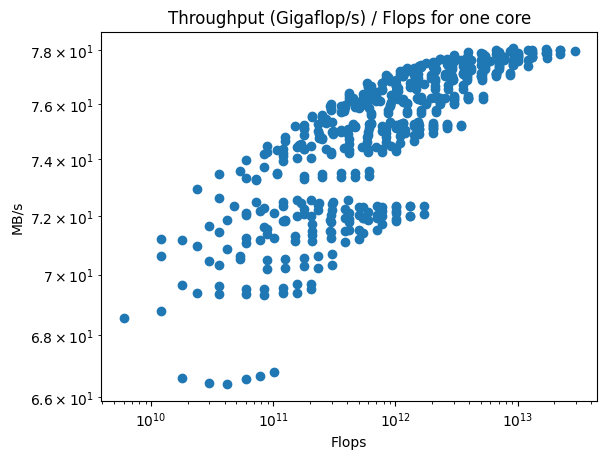

In [173]:
# basic throuput readings for 1 processor

plt.scatter(
    2 * throughput["m"] * throughput["n"] * throughput["k"],
    (2 * throughput["m"] * throughput["n"] * throughput["k"] / throughput["time"])
    * 1e-9,
)

plt.xlabel("Flops")
plt.xscale("log")
plt.ylabel("MB/s")
plt.yscale("log")
plt.title("Throughput (Gigaflop/s) / Flops for one core")


plt.show()

# this shows us that we can suck about 77 MB/s of throughput through one core

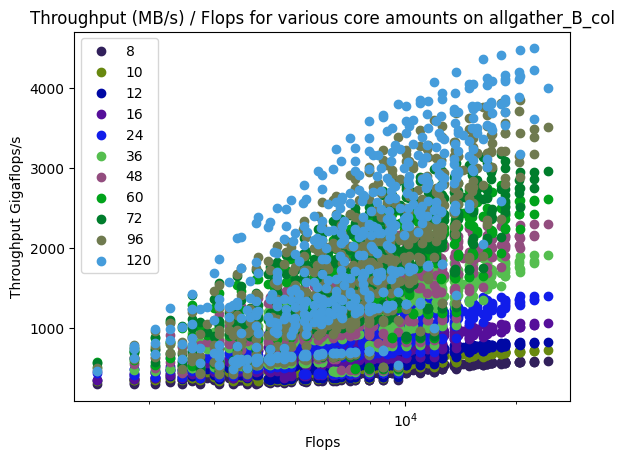

In [9]:
# throughput / flops for various sizes across one strategy

STRATEGY = "allgather_B_col"

strategy = benchmark[benchmark["strategy"] == STRATEGY]

for n in PROCESSOR_VALUES:
    df = split_benchmark_by_n(strategy, n)
    plt.scatter(
        (df["m"] * df["n"] * df["k"]) ** (1 / 3),
        df["throughput"],
        color=np.random.rand(
            3,
        ),
        label=f"{df['size'].iloc[0]}",
    )

plt.xlabel("Flops")
plt.xscale("log")
plt.ylabel("Throughput Gigaflops/s")
# plt.yscale("log")
plt.title(f"Throughput (MB/s) / Flops for various core amounts on {STRATEGY}")

plt.legend()
plt.show()

# We can see that more processor power is being used as we increase the number of cores

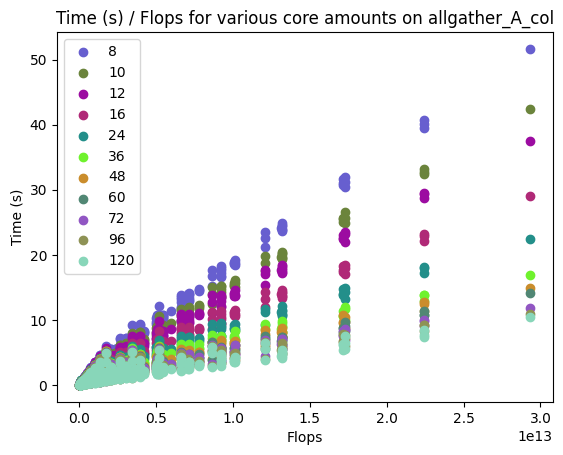

In [10]:
# time / flops for various sizes across one strategy

STRATEGY = "allgather_A_col"

strategy = benchmark[benchmark["strategy"] == STRATEGY]

for n in PROCESSOR_VALUES:
    df = split_benchmark_by_n(strategy, n)
    plt.scatter(
        2 * df["m"] * df["n"] * df["k"],
        df["time"],
        color=np.random.rand(
            3,
        ),
        label=f"{df['size'].iloc[0]}",
    )

plt.xlabel("Flops")
# plt.xscale("log")
plt.ylabel("Time (s)")
# plt.yscale("log")
plt.title(f"Time (s) / Flops for various core amounts on {STRATEGY}")

plt.legend()
plt.show()

(6, 7)


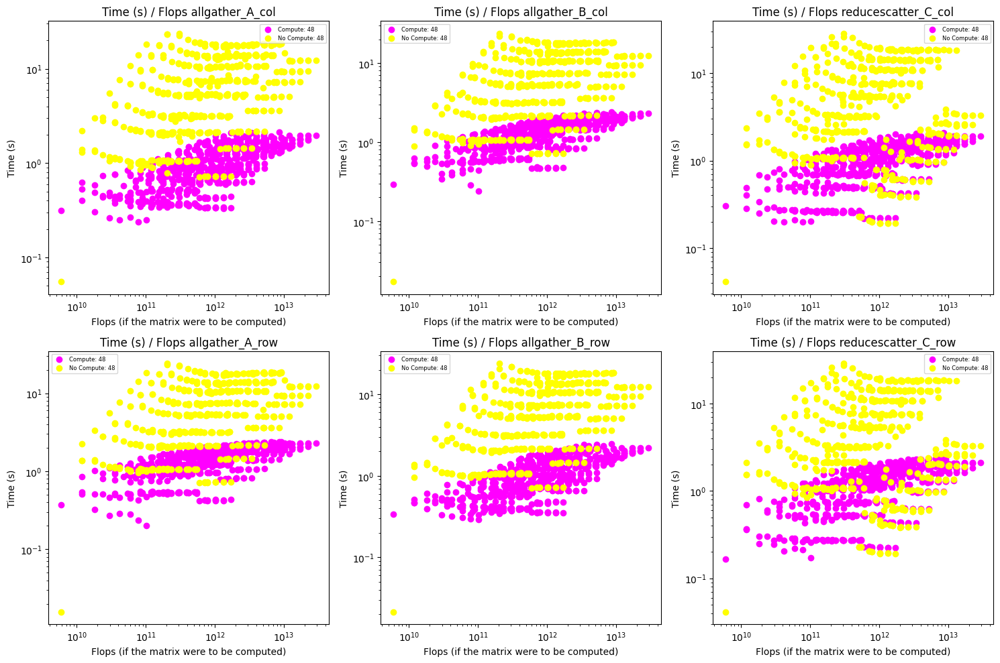

In [174]:
# compute vs no compute


PROCESSOR_RANGE = (6, 7)
MAX_PROCESSOR = max(PROCESSOR_VALUES[PROCESSOR_RANGE[0] : PROCESSOR_RANGE[1]])
print(PROCESSOR_RANGE)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, STRATEGY in enumerate(
    [
        "allgather_A_col",
        "allgather_A_row",
        "allgather_B_col",
        "allgather_B_row",
        "reducescatter_C_col",
        "reducescatter_C_row",
    ]
):
    STRATEGY_NO_COMPUTE = f"{STRATEGY}_no_compute"
    ax = axes[i % 2, i // 2]
    for n in PROCESSOR_VALUES[PROCESSOR_RANGE[0] : PROCESSOR_RANGE[1]]:

        compute_strategy = benchmark[
            (benchmark["size"] == n) & (benchmark["strategy"] == STRATEGY)
        ]
        no_compute_strategy = benchmark[
            (benchmark["size"] == n) & (benchmark["strategy"] == STRATEGY_NO_COMPUTE)
        ]

        ax.scatter(
            2 * compute_strategy["m"] * compute_strategy["n"] * compute_strategy["k"],
            1e-12
            * 2
            * compute_strategy["m"]
            * compute_strategy["n"]
            * compute_strategy["k"]
            / compute_strategy["time"],
            color=(n / MAX_PROCESSOR, 0, n / MAX_PROCESSOR),
            # color="purple",
            label=f"Compute: {n}",
        )

        ax.scatter(
            2
            * no_compute_strategy["m"]
            * no_compute_strategy["n"]
            * no_compute_strategy["k"],
            1e-12
            * 2
            * no_compute_strategy["m"]
            * no_compute_strategy["n"]
            * no_compute_strategy["k"]
            / no_compute_strategy["time"],
            color=(n / MAX_PROCESSOR, n / MAX_PROCESSOR, 0),
            # color="goldenrod",
            label=f"No Compute: {n}",
        )

    ax.set_xlabel("Flops (if the matrix were to be computed)")
    ax.set_xscale("log")
    ax.set_ylabel("Time (s)")
    ax.set_yscale("log")
    ax.set_title(f"Time (s) / Flops {STRATEGY}")
    ax.legend(fontsize=6)

plt.tight_layout()
plt.show()

# subsplots
# we can see that for higher number of cores there is a bigger cost to communication but when we actually do the computation
# the matrix is split along the cores so small in some places with high # of cores that the matrix multiplication is almost negligble

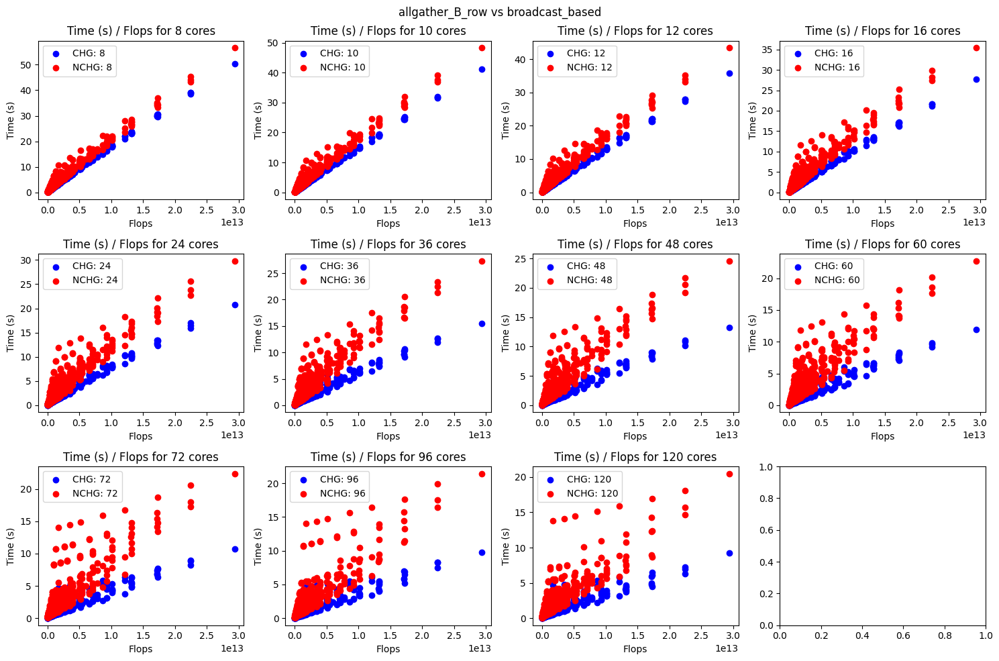

In [48]:
# strategy vs broadcast_based
STRATEGY = "allgather_B_row"
STANDARD_STRATEGY = "broadcast_based"  # CHANGE THIS TO SHOW OVERLAP TOO

chg = benchmark[benchmark["strategy"] == STRATEGY]
nchg = benchmark[benchmark["strategy"] == STANDARD_STRATEGY]

fig, axes = plt.subplots(3, 4, figsize=(15, 10))

for i, n in enumerate(PROCESSOR_VALUES):
    ax = axes[i // 4, i % 4]

    chg_df = chg[chg["size"] == n]
    nchg_df = nchg[nchg["size"] == n]

    ax.scatter(
        2 * chg_df["m"] * chg_df["n"] * chg_df["k"],
        chg_df["time"],
        color="blue",
        label=f"CHG: {n}",
    )
    ax.scatter(
        2 * nchg_df["m"] * nchg_df["n"] * nchg_df["k"],
        nchg_df["time"],
        color="red",
        label=f"NCHG: {n}",
    )

    ax.set_xlabel("Flops")
    ax.set_ylabel("Time (s)")
    ax.set_title(f"Time (s) / Flops for {n} cores")
    ax.legend()

fig.suptitle(f"{STRATEGY} vs {STANDARD_STRATEGY}")
plt.tight_layout()
plt.show()

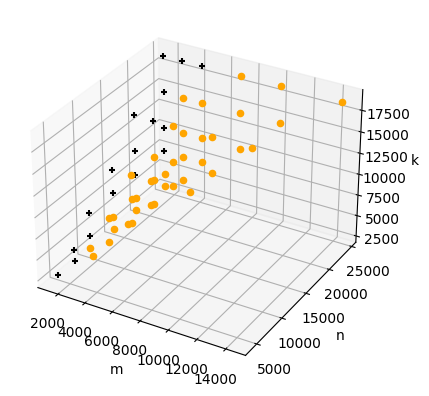

In [104]:
NUM_PROCS = 12


def get_plot_data(df):
    m_vals = df.drop_duplicates(subset=["m"])["m"]
    n_vals = df.drop_duplicates(subset=["n"])["n"]
    k_vals = df.drop_duplicates(subset=["k"])["k"]

    grouped = df.groupby(["m", "n", "k"])

    strategy_colors = {
        "allgather_A_col": ["#000000", "+"],  # black
        "allgather_A_row": ["#ffa500", "o"],  # orange
        "allgather_B_col": ["#00ff00", "s"],  # lime
        "allgather_B_row": ["#00ffff", "x"],  # aqua
        "reducescatter_C_col": ["#0000ff", "^"],  # blue
        "reducescatter_C_row": ["#ff1493", "D"],  # deep pink
    }

    data = []
    for group_name, group in grouped:
        min_strategy = group.loc[group["time"].idxmin(), "strategy"]
        data.append(list(group_name) + strategy_colors[min_strategy])

    return pd.DataFrame(data, columns=["m", "n", "k", "color", "marker"])


mkn = benchmark[
    (benchmark["m"] < benchmark["k"])
    & (benchmark["k"] < benchmark["n"])
    & (~benchmark["strategy"].str.contains("no_compute"))
    & (~benchmark["strategy"].str.contains("broadcast"))
]
kmn = benchmark[
    (benchmark["k"] < benchmark["m"])
    & (benchmark["m"] < benchmark["n"])
    & (~benchmark["strategy"].str.contains("no_compute"))
    & (~benchmark["strategy"].str.contains("broadcast"))
]
knm = benchmark[
    (benchmark["k"] < benchmark["n"])
    & (benchmark["n"] < benchmark["m"])
    & (~benchmark["strategy"].str.contains("no_compute"))
    & (~benchmark["strategy"].str.contains("broadcast"))
]
nkm = benchmark[
    (benchmark["n"] < benchmark["k"])
    & (benchmark["k"] < benchmark["m"])
    & (~benchmark["strategy"].str.contains("no_compute"))
    & (~benchmark["strategy"].str.contains("broadcast"))
]
mnk = benchmark[
    (benchmark["m"] < benchmark["n"])
    & (benchmark["n"] < benchmark["k"])
    & (~benchmark["strategy"].str.contains("no_compute"))
    & (~benchmark["strategy"].str.contains("broadcast"))
]
nmk = benchmark[
    (benchmark["n"] < benchmark["m"])
    & (benchmark["m"] < benchmark["k"])
    & (~benchmark["strategy"].str.contains("no_compute"))
    & (~benchmark["strategy"].str.contains("broadcast"))
]


# data = benchmark[(~benchmark["strategy"].str.contains("no_compute")) & (~benchmark["strategy"].str.contains("broadcast"))]
data = mkn
data = data[data["size"] == NUM_PROCS]

p_data = get_plot_data(data)


fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# only way to get markers to display correctly
for i in range(len(p_data)):
    ax.scatter(
        p_data["m"].iloc[i],
        p_data["n"].iloc[i],
        p_data["k"].iloc[i],
        c=p_data["color"].iloc[i],
        marker=p_data["marker"].iloc[i],  # Use marker for each data point
    )


ax.set_xlabel("m")
ax.set_ylabel("n")
ax.set_zlabel("k")


plt.show()
# compare all algorithms at once and just plot the quickest out of all three, scatter plot
# plot the dots that contradict what should be quickests and figure out like the difference
# plot by smallest dimension to reduce the dimension of the graph
# figure out theoretically best is worse by like whatever it is - try and see if just small error


# Red if strategy2 was faster blue if strategy 1 was faster
# this didn't turn out to be terribly useful

In [85]:
df = benchmark[
    ~benchmark["strategy"].str.contains("no_compute")
    & (~benchmark["strategy"].str.contains("broadcast"))
]

n = 12
df = df[df["size"] == n]

grouped = df.groupby(["m", "n", "k"])


for group_name, group in grouped:
    # print(group)
    min_strategy = group.loc[group["time"].idxmin(), "strategy"]
    print(f"MIN STRAT: {min_strategy}")

MIN STRAT: allgather_A_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: reducescatter_C_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_col
MIN STRAT: allgather_A_col
MIN STRAT: reducescatter_C_col
MIN STRAT: reducescatter_C_col
MIN STRAT: reducescatter_C_col
MIN STRAT: allgather_A_row
MIN STRAT: allgather_A_row
MI

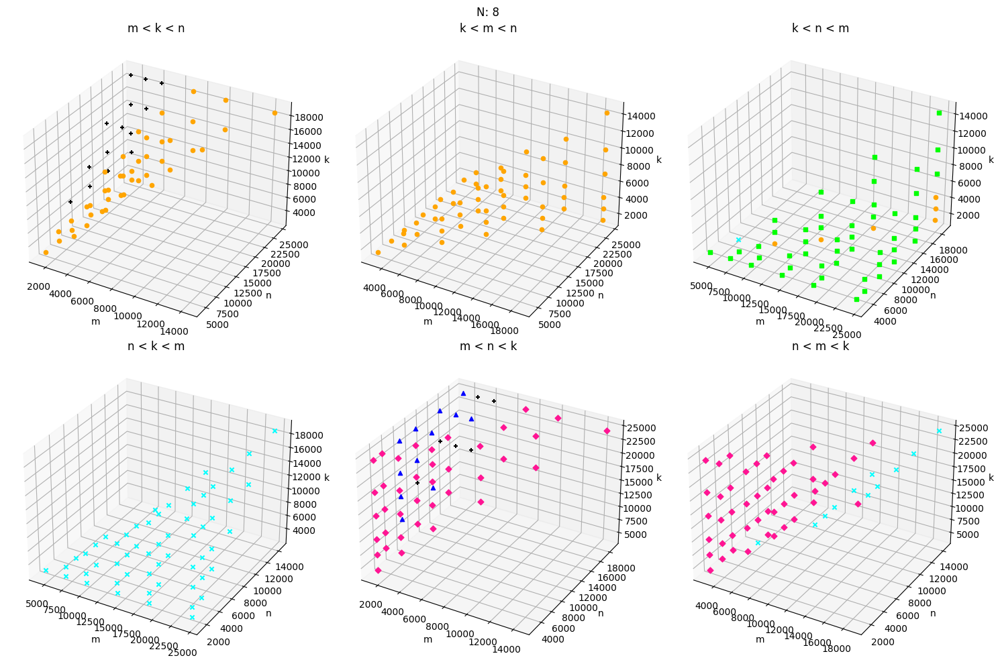

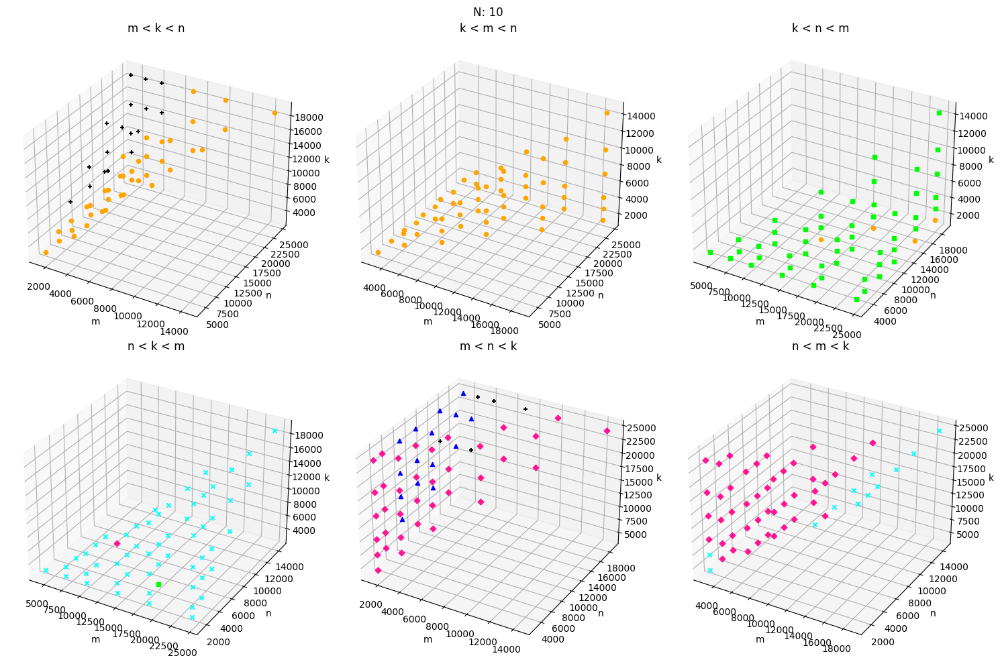

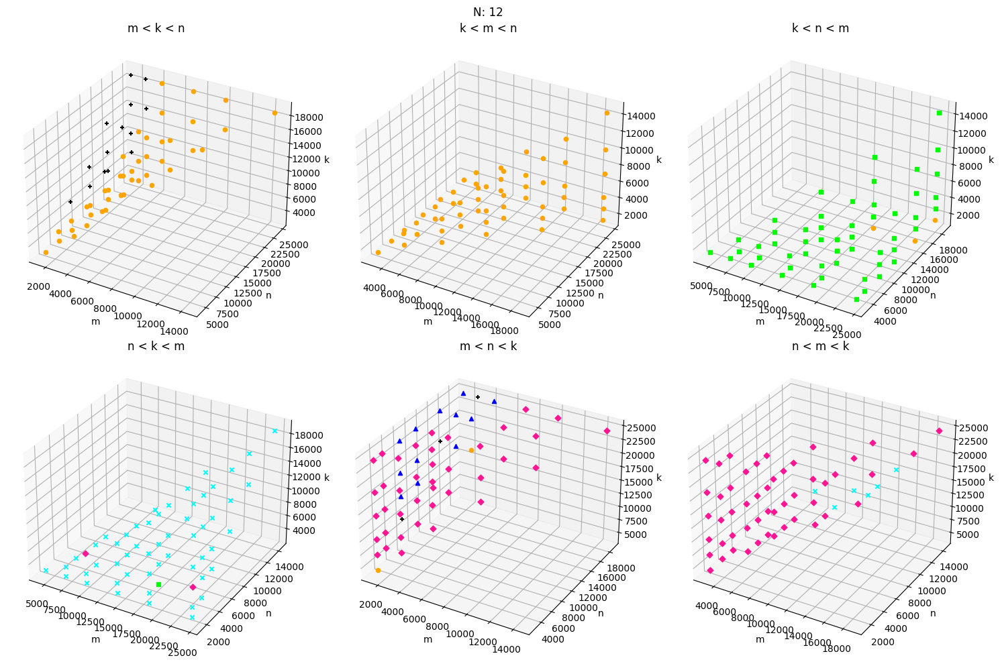

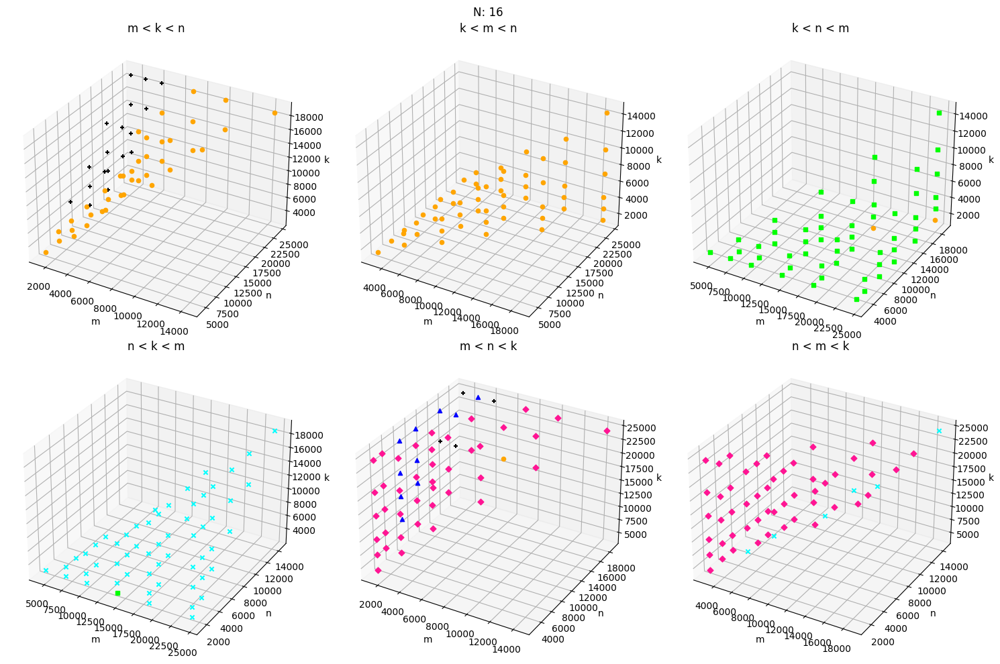

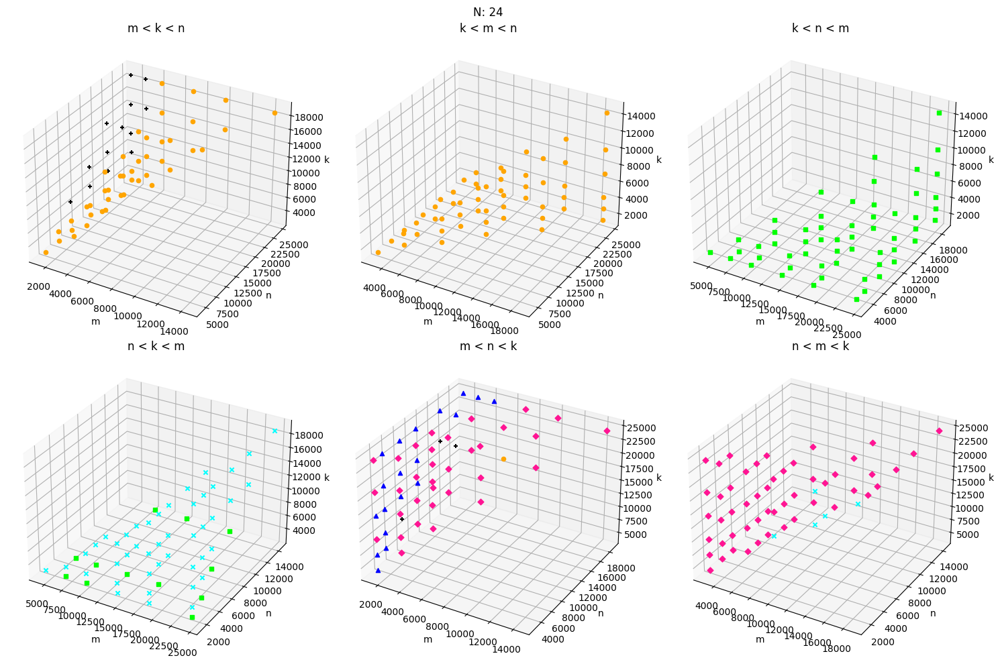

...

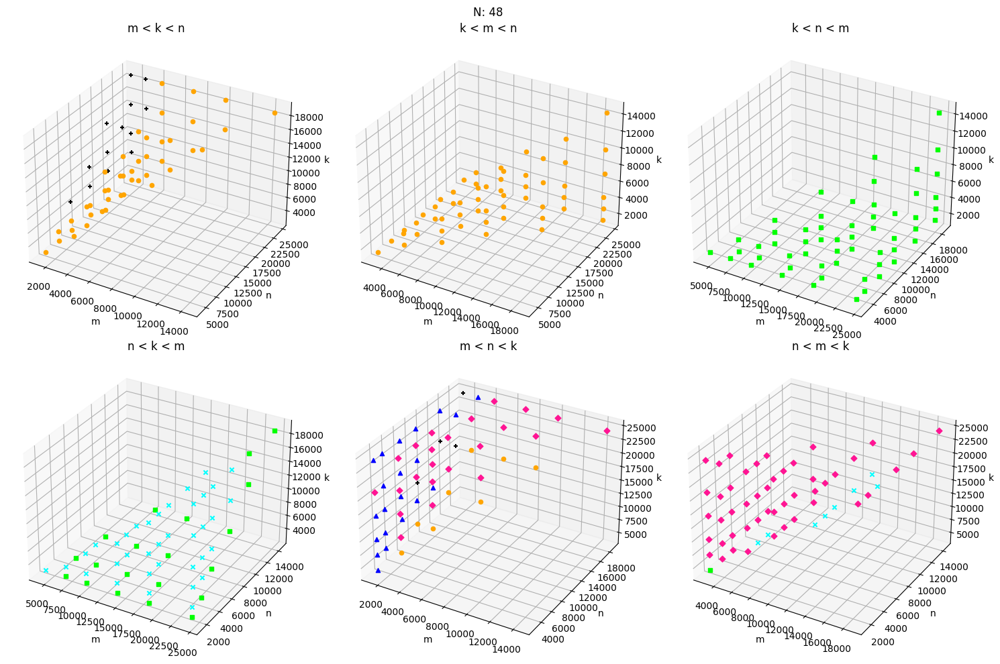

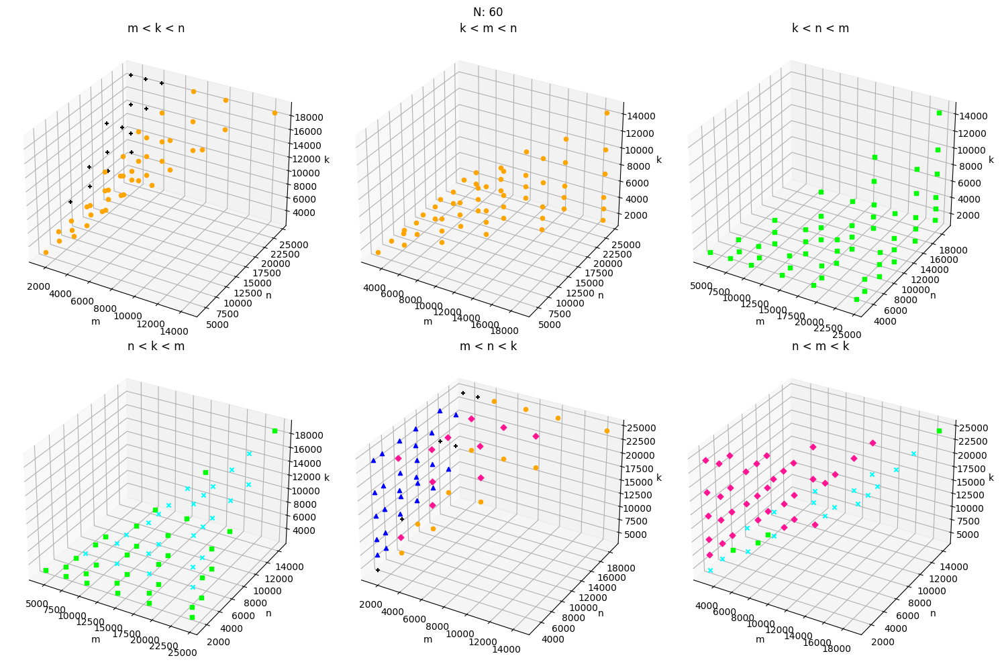

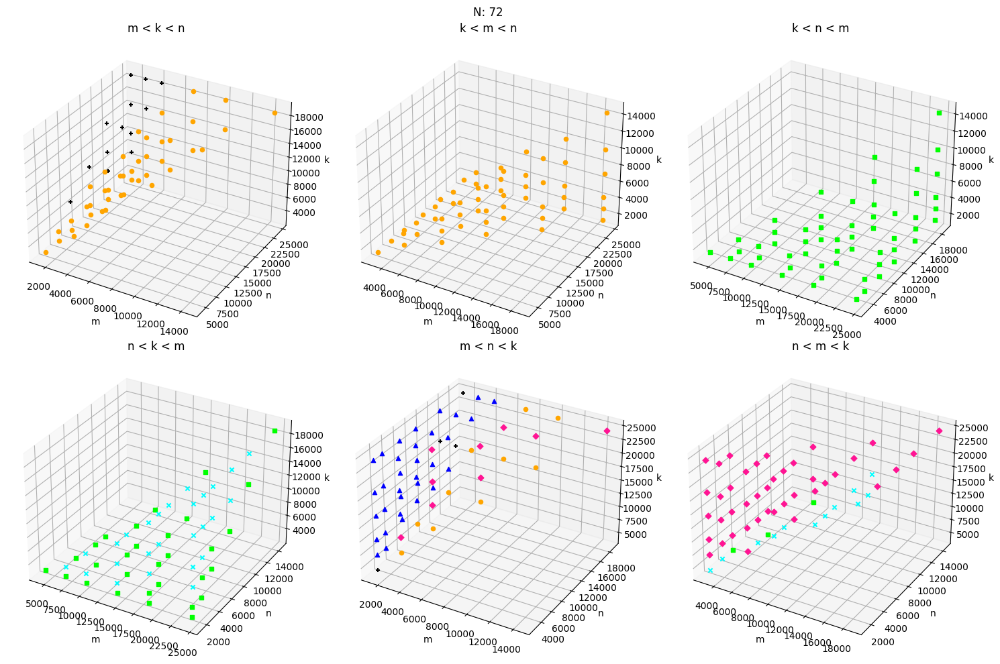

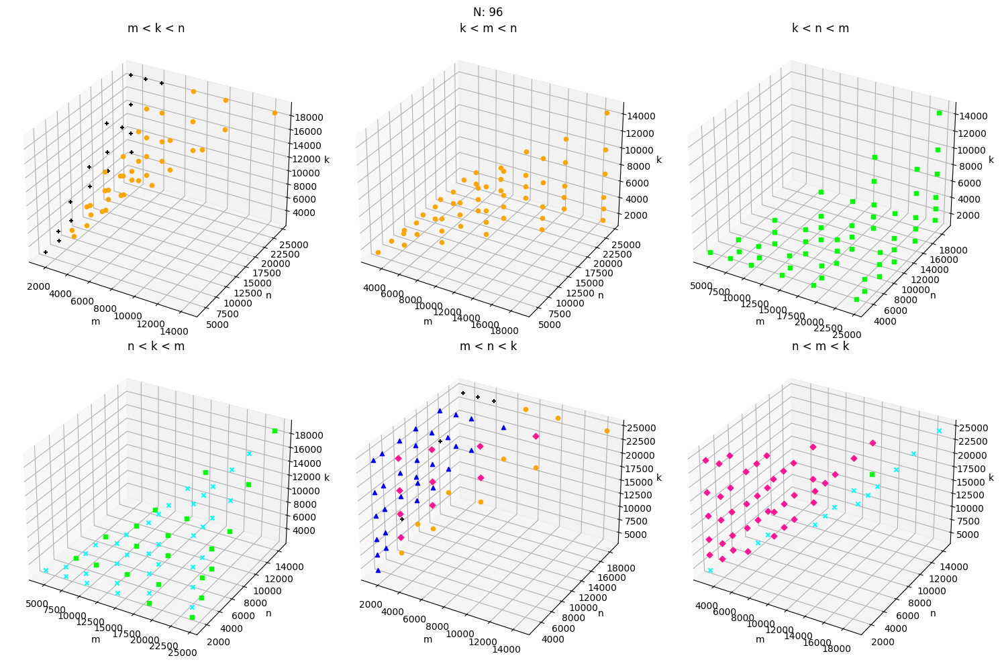

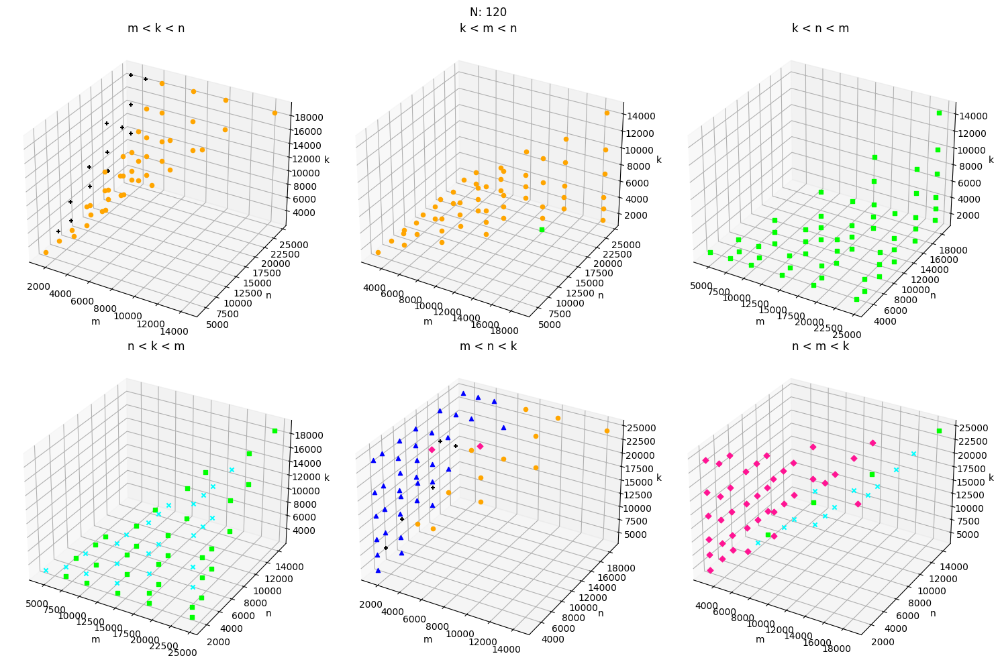

In [115]:
def get_plot_data(df):
    m_vals = df.drop_duplicates(subset=["m"])["m"]
    n_vals = df.drop_duplicates(subset=["n"])["n"]
    k_vals = df.drop_duplicates(subset=["k"])["k"]

    grouped = df.groupby(["m", "n", "k"])

    strategy_colors = {
        "allgather_A_col": ["#000000", "+"],  # black
        "allgather_A_row": ["#ffa500", "o"],  # orange
        "allgather_B_col": ["#00ff00", "s"],  # lime
        "allgather_B_row": ["#00ffff", "x"],  # aqua
        "reducescatter_C_col": ["#0000ff", "^"],  # blue
        "reducescatter_C_row": ["#ff1493", "D"],  # deep pink
    }

    data = []
    for group_name, group in grouped:
        min_strategy = group.loc[group["time"].idxmin(), "strategy"]
        data.append(list(group_name) + strategy_colors[min_strategy])

    return pd.DataFrame(data, columns=["m", "n", "k", "color", "marker"])


def plot_subplot(ax, data, title):
    for i in range(len(data)):
        ax.scatter(
            data["m"].iloc[i],
            data["n"].iloc[i],
            data["k"].iloc[i],
            c=data["color"].iloc[i],
            marker=data["marker"].iloc[i],
        )
        ax.set_xlabel("m")
        ax.set_ylabel("n")
        ax.set_zlabel("k")
        ax.set_title(title)


# Define subsets of data
subsets = [mkn, kmn, knm, nkm, mnk, nmk]
title = ["m < k < n", "k < m < n", "k < n < m", "n < k < m", "m < n < k", "n < m < k"]

for NUM_PROCS in PROCESSOR_VALUES:

    # Create a 2x3 grid of subplots
    fig, axes = plt.subplots(2, 3, figsize=(15, 10), subplot_kw={"projection": "3d"})

    # Plot each subset of data on a subplot
    title_index = 0
    for ax, subset in zip(axes.flatten(), subsets):
        data = subset[subset["size"] == NUM_PROCS]
        p_data = get_plot_data(data)
        plot_subplot(ax, p_data, title[title_index])
        title_index += 1

    fig.suptitle(f"N: {NUM_PROCS}")
    plt.tight_layout()
    plt.show()

# "allgather_A_col": ["#000000", "+"],  # black
# "allgather_A_row": ["#ffa500", "o"],  # orange
# "allgather_B_col": ["#00ff00", "s"],  # lime
# "allgather_B_row": ["#00ffff", "x"],  # aqua
# "reducescatter_C_col": ["#0000ff", "^"],  # blue
# "reducescatter_C_row": ["#ff1493", "D"],  # deep pink

In [116]:
dimensions = [1440, 2880, 4320, 7200, 10080, 14400, 18720, 24480]


def query_by_problem_size(size, df, include_no_compute=False):
    filtered_df = df[(2 * df["m"] * df["n"] * df["k"]) == size]

    if not include_no_compute:
        return filtered_df[
            ~filtered_df["strategy"].str.contains("no_compute", case=False)
        ]
    return filtered_df


def query_by_scaled_problem_size(const, df, include_no_compute=False):
    filtered_df = df[(2 * df["m"] * df["n"] * df["k"]) / df["size"] == const]

    if not include_no_compute:
        return filtered_df[
            ~filtered_df["strategy"].str.contains("no_compute", case=False)
        ]
    return filtered_df


def query_by_strategy(strategy, df):
    return df[df["strategy"] == strategy]


def to_scientific_notation(number, precision=2):
    return "{:.{}e}".format(number, precision)


def get_serial_row(parallel_row):
    serial_row = throughput[
        (throughput["m"] == parallel_row["m"])
        & (throughput["k"] == parallel_row["k"])
        & (throughput["n"] == parallel_row["n"])
    ]
    return serial_row


proc_to_index = {2: 0, 4: 1, 6: 2, 8: 3, 10: 4, 12: 5}

# ~n2["strategy"].str.contains("no_compute", case=False)

In [119]:
problem_combinations = []
problem_sizes = set()

for i in dimensions:
    for j in dimensions:
        for k in dimensions:
            problem_combinations.append((i, j, k))
            problem_sizes.add(2 * i * j * k)

problem_sizes = list(problem_sizes)

/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packages/matplotlib/collections.py:200: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  offsets = np.asanyarray(offsets, float)
/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packages/matplotlib/collections.py:200: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  offsets = np.asanyarray(offsets, float)
/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packages/matplotlib/collections.py:200: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  offsets = np.asanyarray(offsets, float)
/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packa

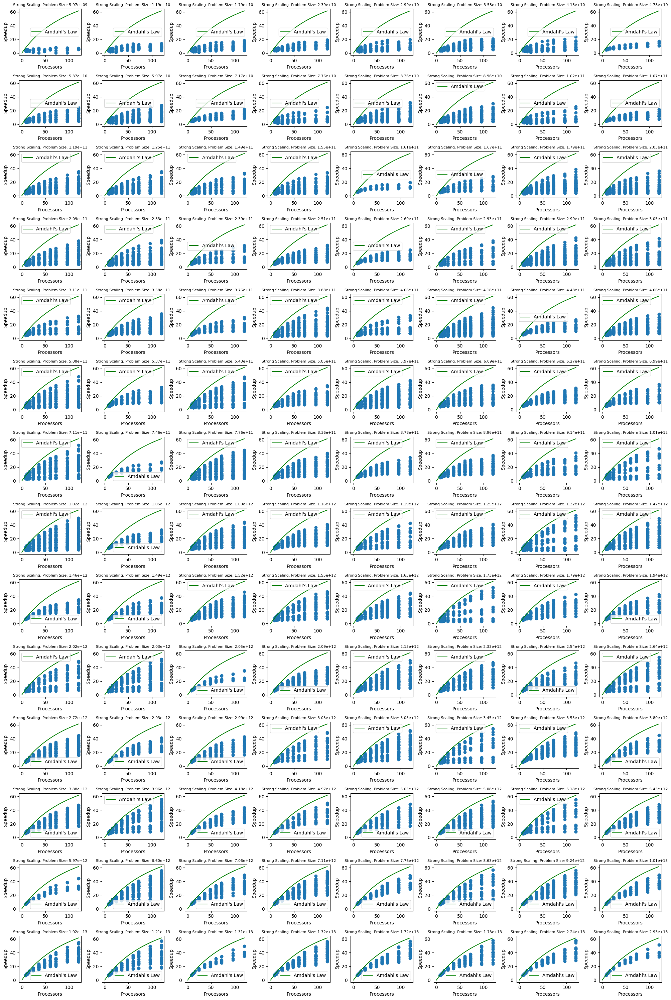

In [154]:
# Strong Scaling


num_rows = 14
num_cols = 8
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 30))

for idx, problem_size in enumerate(sorted(problem_sizes)):
    row_idx = idx // num_cols
    col_idx = idx % num_cols

    parallel_data = benchmark[
        (2 * benchmark["m"] * benchmark["n"] * benchmark["k"] == problem_size)
        & (~benchmark["strategy"].str.contains("no_compute"))
        & (~benchmark["strategy"].str.contains("broadcast"))
    ]

    serial_data = throughput[
        (2 * throughput["m"] * throughput["n"] * throughput["k"] == problem_size)
    ]

    points = [
        (row["size"], get_serial_row(row)["time"] / row["time"])
        for index, row in parallel_data.iterrows()
    ]
    points = pd.DataFrame(points, columns=["size", "speedup"])

    axes[row_idx, col_idx].scatter(points["size"], points["speedup"])

    amdahls_x_values = np.linspace(0.001, 120, 100)
    p = 0.992
    s = 1 - p
    amdahls_y_values = 1 / (s + p / amdahls_x_values)

    axes[row_idx, col_idx].plot(
        amdahls_x_values, amdahls_y_values, color="green", label="Amdahl's Law"
    )

    axes[row_idx, col_idx].set_xlabel("Processors")
    axes[row_idx, col_idx].set_ylabel("Speedup")
    axes[row_idx, col_idx].set_title(
        f"Strong Scaling. Problem Size: {to_scientific_notation(problem_size)}",
        fontsize=8,
    )

    axes[row_idx, col_idx].legend()

plt.tight_layout()
plt.show()

In [149]:
scaled_problem_combinations = []
scaled_problem_sizes = set()

for i in dimensions:
    for j in dimensions:
        for k in dimensions:
            for n in proc_to_index.keys():
                scaled_problem_combinations.append((i, j, k, n))
                scaled_problem_sizes.add(int(2 * i * j * k / n))

scaled_problem_sizes = sorted(list(scaled_problem_sizes))
scaled_problem_sizes

[497664000,
 597196800,
 746496000,
 995328000,
 1194393600,
 1492992000,
 1791590400,
 1990656000,
 2239488000,
 2388787200,
 2488320000,
 2985984000,
 3483648000,
 3583180800,
 3732480000,
 3981312000,
 4180377600,
 4478976000,
 4777574400,
 4976640000,
 5225472000,
 5374771200,
 5971968000,
 6469632000,
 6718464000,
 6967296000,
 7166361600,
 7464960000,
 7763558400,
 7962624000,
 8360755200,
 8460288000,
 8957952000,
 9704448000,
 9953280000,
 10152345600,
 10450944000,
 10749542400,
 11197440000,
 11943936000,
 12441600000,
 12541132800,
 12690432000,
 12939264000,
 13436928000,
 13934592000,
 14929920000,
 15527116800,
 15676416000,
 16124313600,
 16721510400,
 16920576000,
 17418240000,
 17915904000,
 18662400000,
 19408896000,
 19906560000,
 20155392000,
 20304691200,
 20901888000,
 22394880000,
 23290675200,
 23887872000,
 24385536000,
 24883200000,
 25082265600,
 25380864000,
 25878528000,
 26127360000,
 26873856000,
 27869184000,
 29113344000,
 29262643200,
 29859840000,
 30

/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packages/matplotlib/collections.py:200: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  offsets = np.asanyarray(offsets, float)
/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packages/matplotlib/collections.py:200: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  offsets = np.asanyarray(offsets, float)
/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packages/matplotlib/collections.py:200: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  offsets = np.asanyarray(offsets, float)
/home/zachb/gatech/freshman/research/CommHiddenGemm/GemmEnv/lib/python3.11/site-packa

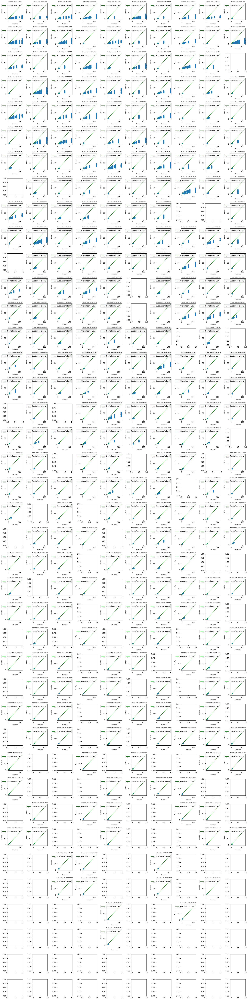

In [165]:
# for problem_size in scaled_problem_sizes:


num_rows = 40
num_cols = 10
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 80))

for idx, problem_size in enumerate(scaled_problem_sizes):
    row_idx = idx // num_cols
    col_idx = idx % num_cols

    weak_scaled_data = benchmark[
        (
            (
                2 * benchmark["m"] * benchmark["n"] * benchmark["k"] / benchmark["size"]
            ).astype(int)
            == problem_size
        )
        & (~benchmark["strategy"].str.contains("no_compute"))
        & (~benchmark["strategy"].str.contains("broadcast"))
    ]

    if weak_scaled_data.empty:
        # TODO figure why there are empty things in here
        continue

    points = [
        (row["size"], get_serial_row(row)["time"] / row["time"])
        for index, row in weak_scaled_data.iterrows()
    ]
    points = pd.DataFrame(points, columns=["size", "speedup"])

    axs[row_idx, col_idx].scatter(points["size"], points["speedup"])

    gustafsons_x_values = np.linspace(0.001, 120, 100)
    p = 0.992
    s = 1 - p
    gustafsons_y_values = s + p * gustafsons_x_values

    axs[row_idx, col_idx].plot(
        gustafsons_x_values, gustafsons_y_values, color="green", label="Gustafson's Law"
    )

    axs[row_idx, col_idx].set_xlabel("Processors", fontsize=6)
    axs[row_idx, col_idx].set_ylabel("Speedup", fontsize=6)
    axs[row_idx, col_idx].set_title(f"Problem Size: {problem_size}", fontsize=6)

    # axs[row_idx, col_idx].legend()

plt.tight_layout()
plt.show()

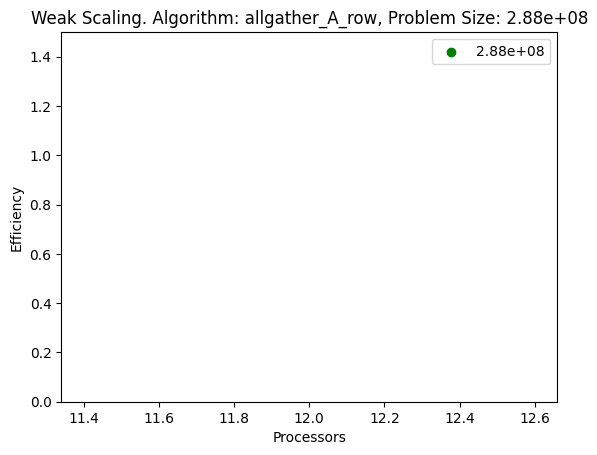

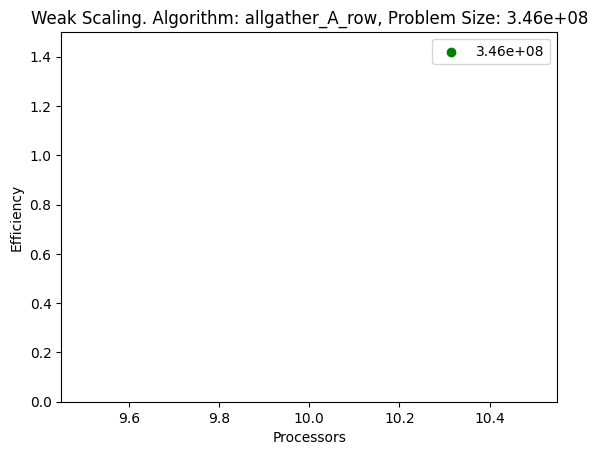

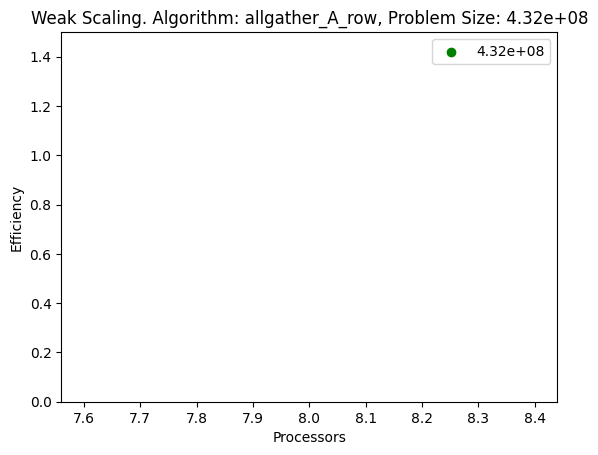

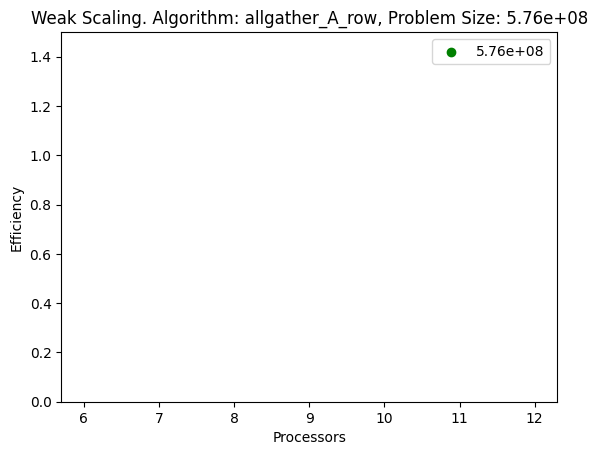

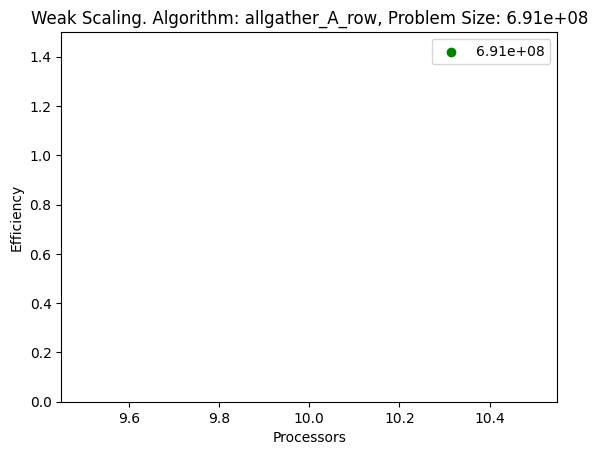

...

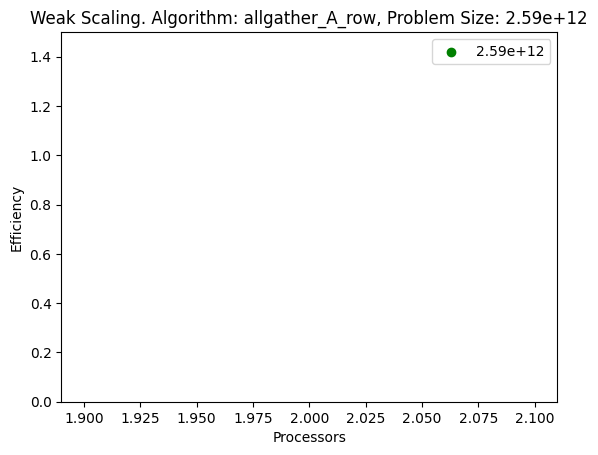

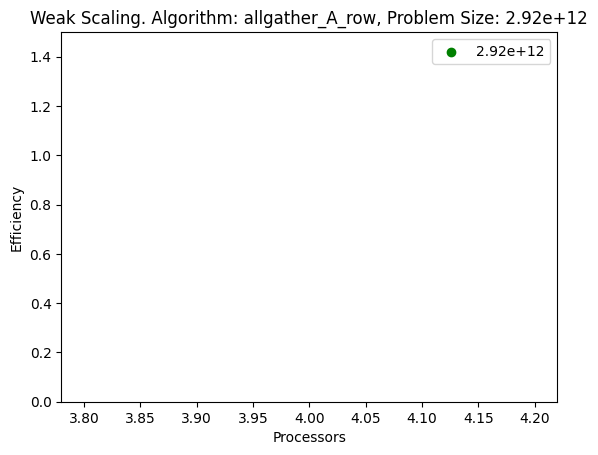

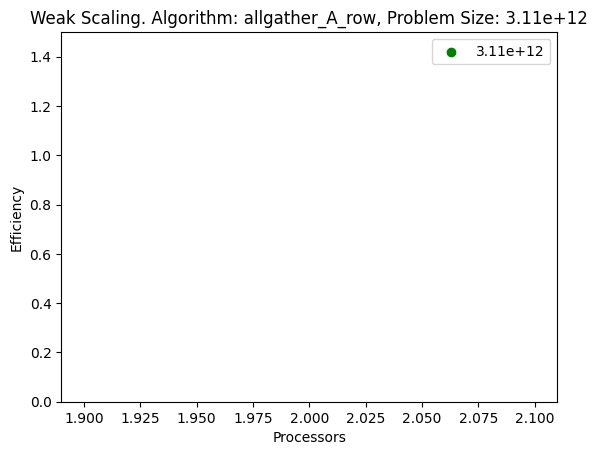

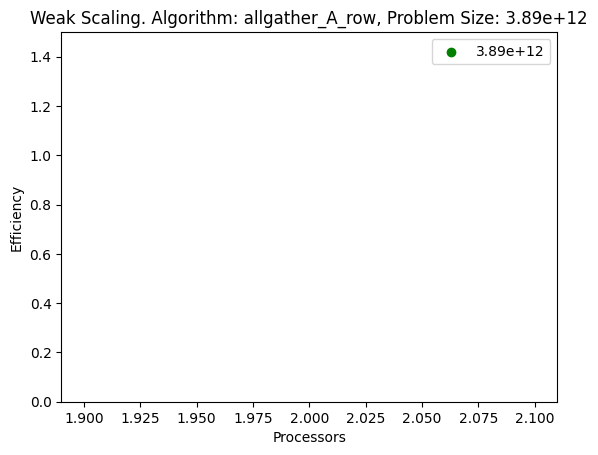

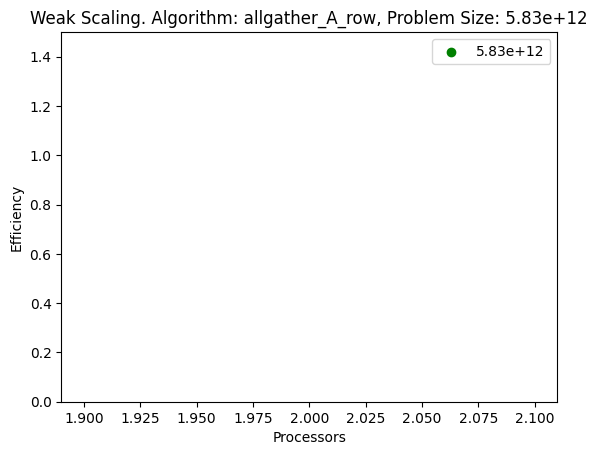

In [49]:
# idk why I didn't combine everything to begin with
combined_data = pd.concat([n2, n4, n6, n8, n10, n12], ignore_index=True)

# scaled_problem_size = problem_sizes[15]
algorithm = "allgather_A_row"

strategy_data = query_by_strategy(algorithm, combined_data)

for scaled_problem_size in scaled_problem_sizes:

    scaled_strategy_data = query_by_scaled_problem_size(
        scaled_problem_size, strategy_data
    )

    serial_time_data = np.array(
        [
            get_serial_row(parallel_row)["time"]
            for index, parallel_row in scaled_strategy_data.iterrows()
        ]
    )

    x_data = np.array(scaled_strategy_data["size"])

    # speedup / p is efficiency
    y_data_efficiency = serial_time_data.flatten() / (
        np.array(scaled_strategy_data["size"]).flatten()
        * np.array(scaled_strategy_data["time"]).flatten()
    )
    y_data_scaled_speedup = (
        serial_time_data.flatten()
        * np.array(scaled_strategy_data["size"]).flatten()
        / (np.array(scaled_strategy_data["time"]).flatten())
    )
    y_data_speedup = serial_time_data.flatten() / (
        np.array(scaled_strategy_data["time"]).flatten()
    )
    # something went wrong with the wall time one it has like a downward slope when the ideal one should be flat
    y_data_wall_time = np.array(scaled_strategy_data["time"]).flatten()

    plt.scatter(
        x_data,
        y_data_speedup,
        label=f"{to_scientific_notation(scaled_problem_size)}",
        color="green",
    )

    plt.title(
        f"Weak Scaling. Algorithm: {algorithm}, Problem Size: {to_scientific_notation(scaled_problem_size)}"
    )
    plt.xlabel("Processors")
    plt.ylabel("Efficiency")

    plt.ylim(0, 1.5)

    plt.legend()

    plt.show()

In [ ]:
# below here is the old stuff

In [ ]:
FILENAME = "../initial-benchmarks/nocheck-n8-benchmark.csv"
df = pd.read_csv(
    FILENAME, names=["strategy", "size", "m", "n", "k", "throughput", "time", "memory"]
)

In [ ]:
grouped = df.groupby("strategy")

# input the strategy name to get the df with that strategy
strategy_dict = {}

for strategy, group_df in grouped:
    strategy_dict[strategy] = group_df

In [ ]:
strategy_dict["reducescatter_C_col"]

In [ ]:
current_strategy = "allgather_A_col"
curr_df = strategy_dict[current_strategy]


# Calculate FLOPS
flops = 2 * curr_df["m"] * curr_df["n"] * curr_df["k"]
flops
# Plot throughput/FLOPS graph
plt.figure(figsize=(10, 6))
plt.plot(flops, curr_df["throughput"], marker="o", linestyle="")
plt.xscale("log")
plt.xlabel("FLOPS")
plt.ylabel("Throughput GF/s")
plt.title(f"Throughput vs FLOPS for {current_strategy}")
plt.grid(True)
plt.show()

# this basically shows us how the max throughput we can get of a node with x number of cores
# it also shows how increasing the problem size allows for more effective cpu use

In [ ]:
current_strategy = "allgather_A_col"
curr_df = strategy_dict[current_strategy]

# Calculate FLOPS
flops = 2 * curr_df["m"] * curr_df["n"] * curr_df["k"]

# Perform linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(
    flops, curr_df["throughput"]
)

# Plot throughput/FLOPS graph with regression line
plt.figure(figsize=(10, 6))
plt.plot(flops, curr_df["throughput"], marker="o", linestyle="", label="Data Points")
plt.plot(
    flops,
    intercept + slope * flops,
    linestyle="-",
    color="red",
    label="Regression Line",
)
plt.xscale("log")
plt.xlabel("FLOPS")
plt.ylabel("Throughput GF/s")
plt.title(f"Throughput vs FLOPS for {current_strategy} with Regression")
plt.legend()
plt.grid(True)
plt.show()

print(f"Slope: {slope}")
print(f"Intercept: {intercept}")
print(f"R-squared: {r_value**2}")
print(f"P-value: {p_value}")
print(f"Standard Error: {std_err}")

# the regression is pretty useless

In [ ]:
plt.figure(figsize=(10, 6))

# Iterate over each strategy
for strategy in STRATEGIES:
    # Select DataFrame for the current strategy
    curr_df = strategy_dict[strategy]

    # Calculate FLOPS
    flops = 2 * curr_df["m"] * curr_df["n"] * curr_df["k"]

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(
        flops, curr_df["throughput"]
    )

    # Plot data points
    # plt.scatter(flops, curr_df['throughput'], label=strategy)

    # Plot regression line
    plt.plot(
        flops,
        intercept + slope * flops,
        linestyle="-",
        label=f"Regression Line: {strategy}",
    )

# Add labels and title
plt.xlabel("FLOPS")
plt.ylabel("Throughput GF/s")
plt.title("Throughput vs FLOPS with Regression Lines for All Strategies")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.show()